<a href="https://colab.research.google.com/github/giveyourselfaTRY/M2A-RLD-TP-PROJET/blob/main/Ruyi_TANG_%2BGuanyu_CHEN_MINI_PROJECT_2_(%E6%AD%A3%E5%B8%B8%E8%BF%90%E8%A1%8C%2B%E4%B8%A4%E7%A7%8D%E7%94%BB%E5%9B%BE%2B%E6%B3%A8%E9%87%8A%E4%BF%AE%E6%94%B9).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Notebook Written by Ruyi TANG and Guanyu CHEN

# Outlook

In this notebook, using BBRL, you will study the effect of partial observability
on the CartPoleContinuous-v1 environment, using either the DDPG or the TD3 algorithm.

To emulate partial observability, you will design dedicated wrappers. Then you will study
whether extending the input of the agent policy and critic with a memory of previous states
and its output with action chunks can help solve the partial observability issue. This will
also be achieved by designing other temporal extension wrappers.

# Installation

In [1]:
# Prepare the environment
try:
    from easypip import easyimport
except ModuleNotFoundError:
    from subprocess import run

    assert (
        run(["pip", "install", "easypip"]).returncode == 0
    ), "Could not install easypip"
    from easypip import easyimport

easyimport("swig")
easyimport("bbrl_utils").setup(maze_mdp=False)

import os
import copy
import numpy as np
import gymnasium as gym
import math
import bbrl_gymnasium  # noqa: F401
import torch
import torch.nn as nn
from bbrl.agents import Agent, Agents, TemporalAgent
from bbrl_utils.algorithms import EpochBasedAlgo
from bbrl_utils.nn import build_mlp, setup_optimizer, soft_update_params
from bbrl_utils.notebook import setup_tensorboard
from bbrl.visu.plot_policies import plot_policy
from omegaconf import OmegaConf

/home/chen_guanyu/deepdac/lib/python3.10/site-packages/bbrl_utils/notebook.py:46: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm  # noqa: F401
error: XDG_RUNTIME_DIR not set in the environment.


# Temporal modification wrappers

The CartPoleContinuous-v1 environment is a custom extension of
[the CartPole environment](https://gymnasium.farama.org/environments/classic_control/cart_pole/)
with continuous actions, between -1 and 1. It is defined in the bbrl_gymnasium library.

As in CartPole, the state of the system contains 4 variables:
- the position $x$,
- the velocity $\dot{x}$,
- the angle of the pole $\theta$,
- the angular velocity $\dot{\theta}$.

To emulate partial observability in CartPoleContinuous-v1, you will hide the $\dot{x}$ and $\dot{\theta}$ features,
by filtering them out of the state of the environment. This is implemented with the ```FeatureFilterWrapper```.

To compensate for partial observability, you will extend the architecture of the agent
with a memory of previous states and its output with action chunks.
This is implemented with to wrappers, the ```ObsTimeExtensionWrapper``` and the ```ActionTimeExtensionWrapper```.

## The FeatureFilterWrapper

The FeatureFilterWrapper removes a feature from the output observation when calling the ```reset()``` and ```step(action)``` functions.
The index of the removed feature is given when building the object.

To hide the $\dot{x}$ and $\dot{\theta}$ features from the CartPoleContinuous-v1 environment,
the idea is to call the wrapper twice, using something like
```env = FeatureFilterWrapper(FeatureFilterWrapper(inner_env, 3), 1)``` where ```inner_env``` is the CartPoleContinuous-v1 environment.

### Exercise 1: code the FeatureFilterWrapper class below.

Beyond rewriting the ```reset()``` and ```step(action)``` functions, beware of adapting the observation space and its shape.

In [2]:
# construction of Feature Filter Wrapper
from gymnasium.spaces import Box

# !pip install gymnasium[mujoco]

class FeatureFilterWrapper(gym.Wrapper):
    def __init__(self, env, feature_index):
        """
        construct function: initialization for wrapper, accept environment and feature index
        :param env: wrapped environment
        :param feature_index: index of the feature to be removed
        """
        super(FeatureFilterWrapper, self).__init__(env)
        self.feature_index = feature_index  # designate the index of feature to be removed

        # adjust the observation space to delete the designated features
        low = np.delete(self.env.observation_space.low, self.feature_index)
        high = np.delete(self.env.observation_space.high, self.feature_index)
        self.observation_space = Box(low=low, high=high, dtype=np.float32)

    def reset(self, **kwargs):
        """
        reset environment to initial state and remove the designated feature
        :param kwargs: keyword arguments for the reset function
        :return: filtered observation, info
        """
        obs, info = self.env.reset(**kwargs)  # get initial state
        filtered_obs = np.delete(obs, self.feature_index)  # delete designated features
        return filtered_obs, info

    def step(self, action):
        """
        execute action in the environment and remove the designated feature
        :param action: action to be executed
        :return: (filtered observation, rewards, whether or not terminated, extra info)
        """
        obs, reward, done, truncated, info = self.env.step(action)  # execute action
        filtered_obs = np.delete(obs, self.feature_index)  # delete designated features
        return filtered_obs, reward, done, truncated, info  # return filtered observation


In [3]:
inner_env = gym.make('CartPoleContinuous-v1')
# according to the question we will remove the angular velocity (index:3)，and then remove the velocity (index:1)
fil_env = FeatureFilterWrapper(FeatureFilterWrapper(inner_env, 3), 1)

Matplotlib backend: inline


## The ObsTimeExtensionWrapper

When facing a partially observable environment, training with RL a reactive agent which just selects an action based on the current observation
is not guaranteed to reach optimality. An option to mitigate this fundamental limitation is to equip the agent with a memory of the past.

One way to do so is to use a recurrent neural network instead of a feedforward one to implement the agent: the neural network contains
some memory capacity and the RL process may tune this internal memory so as to remember exactly what is necessary from the
past observation. This has been done many times using an LSTM, see for instance
[this early paper](https://proceedings.neurips.cc/paper/2001/file/a38b16173474ba8b1a95bcbc30d3b8a5-Paper.pdf).

Another way to do so is to equip the agent with a list-like memory of the past observations
and to extend the critic and policy to take as input the current observation and the previous ones.
This removes the difficulty of learning an adequate representation of the past, but this results in
enlarging the input size of the actor and critic networks. This can only be done if the required memory
horizon to behave optimally is small enough.

In the case of the CartPoleContinuous-v1 environment, one can see immediately that a memory of the previous
observation is enough to compensate for the absence of the derivative features, since $\dot{a} \approx (a_{t} - a_{t-1})$.

So we will extend the RL agent with a memory of size 1.

Though it may not be intuitive at first glance, the simplest way to do so is to embed the environment into a wrapper
which contains the required memory and produces the extended observations. This way, the RL agent will naturally be built
with an extended observation space, and the wrapper will be in charge of concatenating the memorized
observation from the previous step with the current observation received from the inner environment when calling the ```step(action)``` function.
When calling the ```reset()``` function, the memory of observations should be reinitialized with null observations.

### Exercise 2: code the ObsTimeExtensionWrapper class below.

Beyond rewriting the ```reset()``` and ```step(action)``` functions, beware of adapting the observation space and its shape.

In [4]:
# consturction of Observation time extension wrapper
class ObsTimeExtensionWrapper(gym.Wrapper):
    def __init__(self, env):
        """
        construct function: initialize wrapper, extend the observation space to contain the current and previous observation
        :param env: wrapped environment
        """
        super(ObsTimeExtensionWrapper, self).__init__(env)

        # get the shape of observation space
        obs_shape = env.observation_space.shape
        # extend the observation space to the doubled size
        low = np.concatenate([env.observation_space.low, env.observation_space.low])
        high = np.concatenate([env.observation_space.high, env.observation_space.high])
        self.observation_space = Box(low=low, high=high, dtype=np.float32)

        # initialization for saving the previous observations
        self.previous_obs = np.ones(obs_shape, dtype=np.float32)

    def reset(self, **kwargs):
        """
        reset environment to initial state and initialize the previous observation
        :param kwargs: keyword arguments for the reset function
        :return: extended observation, info
        """
        obs, info = self.env.reset(**kwargs)  # reset environment to initialize
        self.previous_obs = np.ones_like(obs)  # initialize the previous observation to zero
        extended_obs = np.concatenate([self.previous_obs, obs])  # observation extended
        return extended_obs, info

    def step(self, action):
        """
        execute action in the environment and concatenate the previous and current observation
        :param action: action to be executed
        :return: (extended observation, rewards, whether or not terminated, extra info)
        """
        obs, reward, done, truncated, info = self.env.step(action)  # execute action
        extended_obs = np.concatenate([self.previous_obs, obs])  # concatenate the current and previous observation

        self.previous_obs = obs  # update the previous observation

        return extended_obs, reward, done, truncated, info


In [5]:
obs_env = ObsTimeExtensionWrapper(inner_env)


## The ActionTimeExtensionWrapper

It has been observed that, in partially observable environments, preparing to play a sequence of actions and only playing
the first can be better than only preparing for one action. The difference comes from the fact that the critic evaluates
sequences of actions, even if only the first is played in practice.

Similarly to the ObsTimeExtensionWrapper, the corresponding behavior can be implemented with a wrapper.
The size of the action space of the extended environment should be
M times the size of the action space of the inner environment. This ensures that the policy and the critic
will consider extended actions.
Besides, the ```step(action)``` function should receive an extended actions of size M times the size of an action,
and should only transmit the first action to the inner environment.


### Exercise 3: code the ActionTimeExtensionWrapper class below.

Beyond rewriting the ```reset()``` and ```step(action)``` functions, beware of adapting the action space and its shape.

In [6]:
# construction of Action Time Extension Wrapper
class ActionTimeExtensionWrapper(gym.Wrapper):
    def __init__(self, env, M):
        """
        Constructor: Initializes the wrapper and sets up the extended action space.

        :param env: The environment to be wrapped.
        :param M: The number of action repetitions (action sequence length).
        """
        super(ActionTimeExtensionWrapper, self).__init__(env)

        # Store the original action space
        self.original_action_space = env.action_space

        # Extend the action space size to M times the original action space
        self.action_space = Box(
            low=np.tile(env.action_space.low, M),
            high=np.tile(env.action_space.high, M),
            dtype=np.float32
        )

        self.M = M

    def reset(self, **kwargs):
        """
        Resets the environment and initializes the action buffer.

        :param kwargs: Keyword arguments for the reset function.
        :return: The initial observation from the environment.
        """
        return self.env.reset(**kwargs)

    def step(self, action):
        """
        Executes the first action from the extended action array in the inner environment.

        :param action: The extended action array (of size M times the original action space).
        :return: The result of the step in the inner environment (observation, reward, done, info).
        """
        # Extract the first action from the extended action
        first_action = action[:self.original_action_space.shape[0]]

        # Verify that first_action is within the action space bounds
        first_action = np.clip(
            first_action,
            self.original_action_space.low,
            self.original_action_space.high
        )

        # Step the inner environment with the first action
        return self.env.step(first_action)




In [7]:
act_env=ActionTimeExtensionWrapper(inner_env,2)

## Launching tensorboard to visualize the results

In [8]:
setup_tensorboard("./outputs/tblogs")

Reusing TensorBoard on port 6006 (pid 1186), started 6 days, 1:55:02 ago. (Use '!kill 1186' to kill it.)

# Experimental study

To run the experiments below, you can use the [DDPG](https://arxiv.org/pdf/1509.02971.pdf)
or [TD3](http://proceedings.mlr.press/v80/fujimoto18a/fujimoto18a.pdf) algorithms.

You can just copy paste here the code you have used during the corresponding labs.
We only provide a suggested set of hyper-parameters working well on the CartPoleContinuous-v1 environment for DDPG.

## DDPG

In [9]:
class ContinuousQAgent(Agent):
    def __init__(self, state_dim, hidden_layers, action_dim):
        super().__init__()
        self.is_q_function = True
        self.model = build_mlp(
            [state_dim + action_dim] + list(hidden_layers) + [1], activation=nn.ReLU()
        )

    def forward(self, t):
        # Get the current state $s_t$ and the chosen action $a_t$
        obs = self.get(("env/env_obs", t))  # shape B x D_{obs}
        action = self.get(("action", t))  # shape B x D_{action}

        # Compute the Q-value(s_t, a_t)
        obs_act = torch.cat((obs, action), dim=1)  # shape B x (D_{obs} + D_{action})
        # Get the q-value (and remove the last dimension since it is a scalar)
        q_value = self.model(obs_act).squeeze(-1)
        self.set((f"{self.prefix}q_value", t), q_value)

    def predict_value(self, obs, action):
        obs_act = torch.cat((obs, action), dim=0)
        q_value = self.model(obs_act)
        return q_value

In [10]:
class ContinuousDeterministicActor(Agent):
    def __init__(self, state_dim, hidden_layers, action_dim):
        super().__init__()
        layers = [state_dim] + list(hidden_layers) + [action_dim]
        self.model = build_mlp(
            layers, activation=nn.ReLU(), output_activation=nn.Tanh()
        )

    def forward(self, t, **kwargs):
        obs = self.get(("env/env_obs", t))
        action = self.model(obs)
        self.set(("action", t), action)

    def predict_action(self, obs, stochastic):
        assert (
            not stochastic
        ), "ContinuousDeterministicActor cannot provide stochastic predictions"
        return self.model(obs)

In [11]:
from torch.distributions import Normal

In [12]:
class AddGaussianNoise(Agent):
    def __init__(self, sigma):
        super().__init__()
        self.sigma = sigma

    def forward(self, t, **kwargs):
        act = self.get(("action", t))
        dist = Normal(act, self.sigma)
        action = dist.sample()
        self.set(("action", t), action)

In [13]:
class AddOUNoise(Agent):
    """
    Ornstein Uhlenbeck process noise for actions as suggested by DDPG paper
    """

    def __init__(self, std_dev, theta=0.15, dt=1e-2):
        self.theta = theta
        self.std_dev = std_dev
        self.dt = dt
        self.x_prev = 0

    def forward(self, t, **kwargs):
        act = self.get(("action", t))
        x = (
            self.x_prev
            + self.theta * (act - self.x_prev) * self.dt
            + self.std_dev * math.sqrt(self.dt) * torch.randn(act.shape)
        )
        self.x_prev = x
        self.set(("action", t), x)

In [14]:
# Defines the (Torch) mse loss function
# `mse(x, y)` computes $\|x-y\|^2$
mse = nn.MSELoss()


def compute_critic_loss(cfg, reward, must_bootstrap, q_values, target_q_values):
    """Compute the DDPG critic loss from a sample of transitions

    :param cfg: The configuration
    :param reward: The reward (shape 2xB)
    :param must_bootstrap: Must bootstrap flag (shape 2xB)
    :param q_values: The computed Q-values (shape 2xB)
    :param target_q_values: The Q-values computed by the target critic (shape 2xB)
    :return: the loss (a scalar)
    """
    # Compute temporal difference
    # To be completed...
    target = reward[1] + cfg.algorithm.discount_factor * target_q_values[1] * must_bootstrap[1]
    loss = mse(target.detach(), q_values[0])
    return loss


In [15]:
def compute_actor_loss(q_values):
    """Returns the actor loss

    :param q_values: The q-values (shape 2xB)
    :return: A scalar (the loss)
    """
    # Step 1: Negate the Q-values (we want to maximize Q-values, so we minimize the negative)
    neg_q_values = -q_values[0]

    # Step 2: Compute the mean of the negated Q-values as the actor loss
    actor_loss = neg_q_values.mean()

    return actor_loss


In [16]:
class DDPG(EpochBasedAlgo):
    def __init__(self, cfg, env_wrappers):
        super().__init__(cfg, env_wrappers)

        # we create the critic and the actor, but also an exploration agent to
        # add noise and a target critic. The version below does not use a target
        # actor as it proved hard to tune, but such a target actor is used in
        # the original paper.

        obs_size, act_size = self.train_env.get_obs_and_actions_sizes()

        # se the inputed environment ti get dynamically the dimension of observation space and action space
        # obs_size = self.train_env.observation_space.shape[0]
        # act_size = self.train_env.action_space.shape[0]

        self.critic = ContinuousQAgent(
            obs_size, cfg.algorithm.architecture.critic_hidden_size, act_size
        ).with_prefix("critic/")
        self.target_critic = copy.deepcopy(self.critic).with_prefix("target-critic/")

        self.actor = ContinuousDeterministicActor(
            obs_size, cfg.algorithm.architecture.actor_hidden_size, act_size
        )

        # As an alternative, you can use `AddOUNoise`
        noise_agent = AddGaussianNoise(cfg.algorithm.action_noise)

        self.train_policy = Agents(self.actor, noise_agent)
        self.eval_policy = self.actor

        # Define agents over time
        self.t_actor = TemporalAgent(self.actor)
        self.t_critic = TemporalAgent(self.critic)
        self.t_target_critic = TemporalAgent(self.target_critic)

        # Configure the optimizer
        self.actor_optimizer = setup_optimizer(cfg.actor_optimizer, self.actor)
        self.critic_optimizer = setup_optimizer(cfg.critic_optimizer, self.critic)


In [17]:
def run_ddpg(ddpg: DDPG):

    for rb in ddpg.iter_replay_buffers():
        rb_workspace = rb.get_shuffled(ddpg.cfg.algorithm.batch_size)
        terminated, reward = rb_workspace["env/terminated", "env/reward"]

        # Determines whether values of the critic should be propagated
        # True if the episode reached a time limit or if the task was not done
        # See https://github.com/osigaud/bbrl/blob/master/docs/time_limits.md
        must_bootstrap = ~terminated

        # Critic update
        # compute q_values: at t, we have Q(s,a) from the (s,a) in the RB
        ddpg.t_critic(rb_workspace, t=0, n_steps=1)

        with torch.no_grad():
            # replace the action at t+1 in the RB with \pi(s_{t+1}), to compute
            # Q(s_{t+1}, \pi(s_{t+1}) below
            ddpg.t_actor(rb_workspace, t=1, n_steps=1)
            # compute q_values: at t+1 we have Q(s_{t+1}, \pi(s_{t+1})
            ddpg.t_target_critic(rb_workspace, t=1, n_steps=1)

        # finally q_values contains the above collection at t=0 and t=1
        q_values, post_q_values = rb_workspace[
            "critic/q_value", "target-critic/q_value"
        ]

        # Compute critic loss
        critic_loss = compute_critic_loss(
            ddpg.cfg, reward, must_bootstrap, q_values, post_q_values
        )
        ddpg.logger.add_log("critic_loss", critic_loss, ddpg.nb_steps)
        ddpg.critic_optimizer.zero_grad()
        critic_loss.backward()
        torch.nn.utils.clip_grad_norm_(
            ddpg.critic.parameters(), ddpg.cfg.algorithm.max_grad_norm
        )
        ddpg.critic_optimizer.step()

        # Actor update

        # Now we determine the actions the current policy would take in the states from the RB
        ddpg.t_actor(rb_workspace, t=0, n_steps=1)

        # We determine the Q values resulting from actions of the current policy
        ddpg.t_critic(rb_workspace, t=0, n_steps=1)

        # and we back-propagate the corresponding loss to maximize the Q values
        q_values = rb_workspace["critic/q_value"]
        actor_loss = compute_actor_loss(q_values)

        ddpg.logger.add_log("actor_loss", actor_loss, ddpg.nb_steps)

        # if -25 < actor_loss < 0 and nb_steps > 2e5:
        ddpg.actor_optimizer.zero_grad()
        actor_loss.backward()
        torch.nn.utils.clip_grad_norm_(
            ddpg.actor.parameters(), ddpg.cfg.algorithm.max_grad_norm
        )
        ddpg.actor_optimizer.step()

        # Soft update of target q function
        soft_update_params(
            ddpg.critic, ddpg.target_critic, ddpg.cfg.algorithm.tau_target
        )

        if ddpg.evaluate():
            if ddpg.cfg.plot_agents:
                plot_policy(
                    ddpg.actor,
                    ddpg.eval_env,
                    ddpg.best_reward,
                    str(ddpg.base_dir / "plots"),
                    ddpg.cfg.gym_env.env_name,
                    stochastic=False,
                )

## Definition of the parameters

The logger is defined as `bbrl.utils.logger.TFLogger` so as to use a
tensorboard visualisation.

In [18]:
params = {
    "save_best": False,
    "base_dir": "${gym_env.env_name}/ddpg-S${algorithm.seed}_${current_time:}",
    "collect_stats": True,
    # Set to true to have an insight on the learned policy
    # (but slows down the evaluation a lot!)
    "plot_agents": True,
    "algorithm": {
        "seed": 2,
        "max_grad_norm": 0.5,
        "epsilon": 0.02,
        "n_envs": 1,
        "n_steps": 100,
        "nb_evals": 10,
        "discount_factor": 0.8,
        "buffer_size": 1e6,
        "batch_size": 64,
        "tau_target": 0.05,
        "eval_interval": 2_000,
        "max_epochs": 1500,
        # Minimum number of transitions before learning starts
        "learning_starts": 10_000,
        "action_noise": 0.1,
        "architecture": {
            "actor_hidden_size": [400, 300],
            "critic_hidden_size": [400, 300],
        },
    },
    "gym_env": {
        "env_name": "CartPoleContinuous-v1",
    },
    "actor_optimizer": {
        "classname": "torch.optim.Adam",
        "lr": 1e-3,
        # "eps": 5e-5,
    },
    "critic_optimizer": {
        "classname": "torch.optim.Adam",
        "lr": 1e-3,
        # "eps": 5e-5,
    },
}

### Exercise 4:

You now have all the elements to study the impact of removing features from the environment
on the training performance, and the impact of temporally extending the agent in mitigating
partial observability, both with observation and with action extension.

In practice, you should produce the following learning curves:

- a learning curve of your algorithm on the standard CartPoleContinuous-v1 environment with full observability,
- two learning curves, one from removing $\dot{x}$ from CartPoleContinuous-v1 and the other from removing $\dot{\theta}$,
- one learning curve from removing both $\dot{x}$ and $\dot{\theta}$,
- the same four learning curves as above, but adding each of the temporal extension wrappers, separately or combined.

The way to combine these learning curves in different figures is open to you but should be carefully considered
depending on the conclusions you want to draw. Beware of drawing conclusions from insufficient statistics.

Discuss what you observe and conclude from this study.

In [19]:
from torch.utils.tensorboard import SummaryWriter
from bbrl.stats import WelchTTest

2024-10-16 23:32:45.199395: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-16 23:32:45.225016: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-16 23:32:45.232299: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-10-16 23:32:45.265373: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-10-16 23:32:46.152000: W tensorflow/compiler/tf2

In [20]:

conf = OmegaConf.create(params)

# 1.standard env with full observation
ddpg_standard = DDPG(conf, [])
run_ddpg(ddpg_standard)

# 2: remove the feature of velocity  (x˙)
ddpg_remove_velocity = DDPG(conf, [lambda env: FeatureFilterWrapper(env, 1)])
run_ddpg(ddpg_remove_velocity)

# 3: remove the features of angular velocity (θ˙)
ddpg_remove_angular_velocity = DDPG(conf, [lambda env: FeatureFilterWrapper(env, 3)])
run_ddpg(ddpg_remove_angular_velocity)

# 4: remove both features of velocity and angular velocity (using FeatureFilterWrapper for 2 times)
ddpg_remove_both = DDPG(conf, [lambda env: FeatureFilterWrapper(FeatureFilterWrapper(env, 3), 1)])
run_ddpg(ddpg_remove_both)


  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

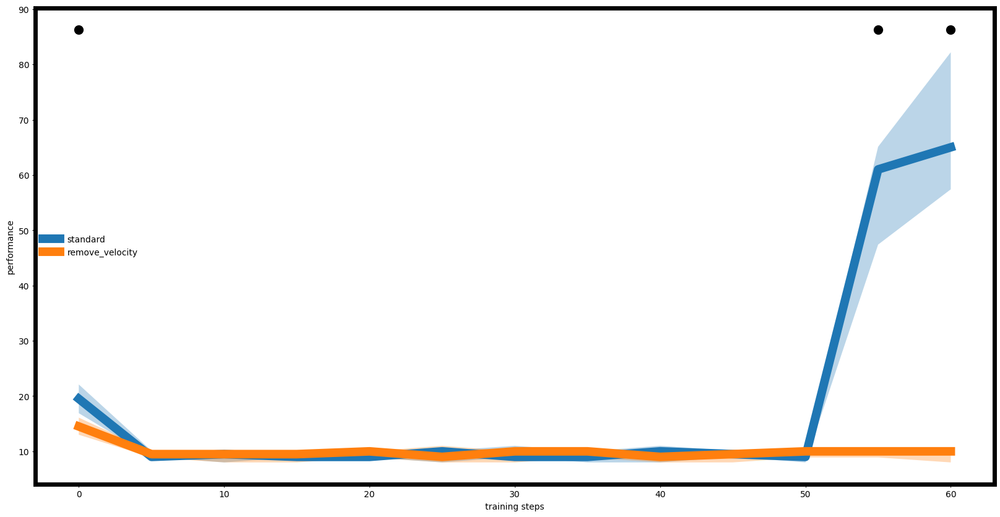

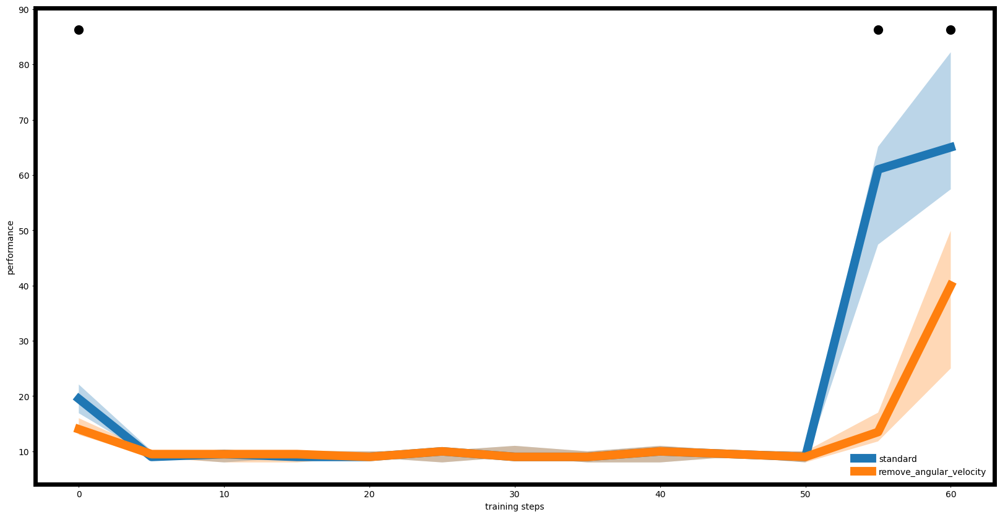

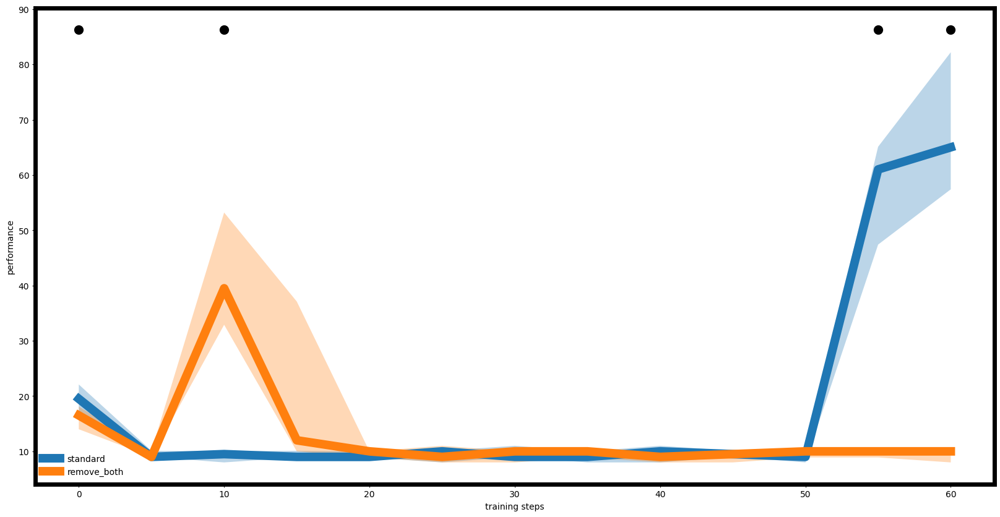

In [21]:
WelchTTest().plot(
    torch.stack(ddpg_standard.eval_rewards),
    torch.stack(ddpg_remove_velocity.eval_rewards),
    legends="standard/remove_velocity",
    save=False,
)

WelchTTest().plot(
    torch.stack(ddpg_standard.eval_rewards),
    torch.stack(ddpg_remove_angular_velocity.eval_rewards),
    legends="standard/remove_angular_velocity",
    save=False,
)

WelchTTest().plot(
    torch.stack(ddpg_standard.eval_rewards),
    torch.stack(ddpg_remove_both.eval_rewards),
    legends="standard/remove_both",
    save=False,
)

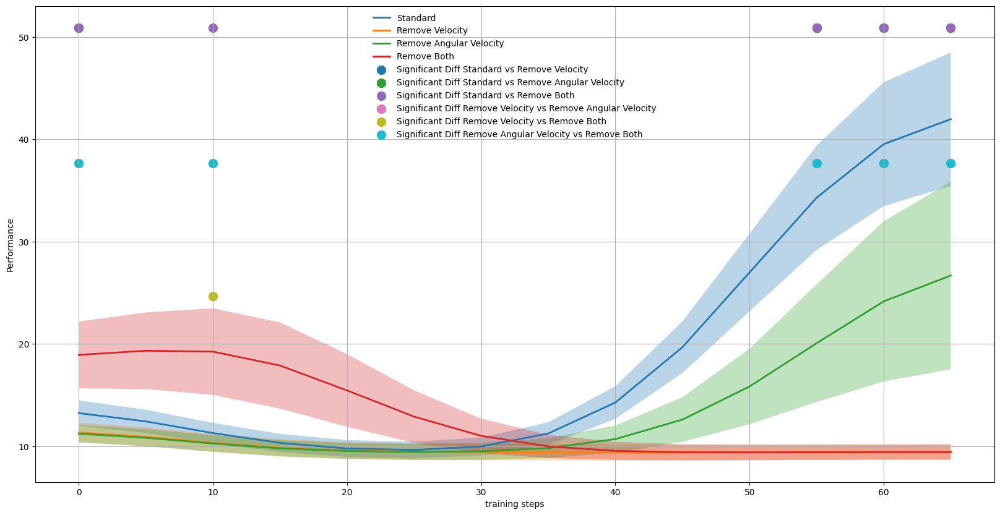

In [22]:
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d

from scipy.stats import ttest_ind

def plot_multiple_curves(
    data_list,  # List of torch.Tensor (n_steps, n_seeds)
    legends,  # List of labels for each curve
    point_every=1,  # Evaluation frequency for downsampling
    id_central="mean",  # Method for computing central tendency ("mean" or "median")
    id_error=80,  # Error measure ("std", "sem", or percentile)
    xlabel="training steps",  # Label for the x-axis
    save=False,  # Save the figure if True
    smooth_sigma=2,  # Gaussian smoothing sigma
    confidence_level=0.01  # Significance level for Welch test
):
    """

    Parameters:
    - data_list: List of (n_steps, n_seeds) torch.Tensor
    - legends: List of labels for each curve
    - point_every: Evaluation frequency for downsampling
    - id_central: Central tendency method ("mean" or "median")
    - id_error: Error representation ("std", "sem", or percentile)
    - xlabel: Label for the x-axis
    - save: If True, save the plot to a file
    - smooth_sigma: Standard deviation for Gaussian smoothing
    - confidence_level: Significance level for Welch test
    """
    fig, ax = plt.subplots(figsize=(20, 10))

    # Downsample the steps for visualization
    nb_steps = min([data.shape[0] for data in data_list])
    steps = np.arange(0, nb_steps, point_every)

    # Colors for significance markers
    num_comparisons = len(data_list) * (len(data_list) - 1) // 2
    marker_colors = plt.cm.get_cmap("tab10", num_comparisons)

    # Compute central tendency and error for each dataset
    results = []
    for idx, data in enumerate(data_list):
        central, low, high = compute_central_tendency_and_error(id_central, id_error, data[::point_every, :])

        # Apply Gaussian smoothing
        central_smooth = gaussian_filter1d(central, sigma=smooth_sigma)
        low_smooth = gaussian_filter1d(low, sigma=smooth_sigma)
        high_smooth = gaussian_filter1d(high, sigma=smooth_sigma)

        results.append((central_smooth, low_smooth, high_smooth))

        # Plot central tendency and error area
        ax.plot(steps, central_smooth, linewidth=2, label=legends[idx])
        ax.fill_between(steps, low_smooth, high_smooth, alpha=0.3)

    # Perform Welch's t-test between each pair of curves
    significant_diffs = []
    color_idx = 0
    for i in range(len(data_list) - 1):
        for j in range(i + 1, len(data_list)):
            sign_diff = np.zeros(steps.shape)
            for k, step in enumerate(steps):
                _, p_value = ttest_ind(data_list[i][step, :], data_list[j][step, :], equal_var=False, nan_policy='omit')
                sign_diff[k] = 1 if p_value < confidence_level else 0
            significant_diffs.append((i, j, sign_diff, marker_colors(color_idx)))
            color_idx += 1

    # Plot significance markers with different colors
    for i, j, sign_diff, color in significant_diffs:
        idx = np.argwhere(sign_diff == 1).flatten()
        y = max(np.nanmax(results[i][2]), np.nanmax(results[j][2]))  # Use max of high values
        ax.scatter(steps[idx], y * 1.05 * np.ones(idx.size), s=100, c=[color], marker="o", label=f"Significant Diff {legends[i]} vs {legends[j]}")

    # Style and finalize the plot
    ax.set_xlabel(xlabel)
    ax.set_ylabel("Performance")
    ax.legend(frameon=False)
    ax.grid(True)

    if save:
        plt.savefig("multi_reward_comparison.png", dpi=100)

    plt.show()

def compute_central_tendency_and_error(id_central, id_error, data):
    """
    calculate the central tendance of the data(mean or median) and error area(std, sem or percenatge）。
    id_central: "mean" or "median"
    id_error: "std", "sem"  or percentage （between 0-100）
    data: numpy array with dimension of (n_steps, n_seeds)
    """
    if id_central == "mean":
        central = np.nanmean(data, axis=1)
    elif id_central == "median":
        central = np.nanmedian(data, axis=1)
    else:
        raise ValueError("id_central should be either 'mean' or 'median'")

    if id_error == "std":
        error = np.nanstd(data, axis=1)
        low, high = central - error, central + error
    elif id_error == "sem":
        error = np.nanstd(data, axis=1) / np.sqrt(data.shape[1])
        low, high = central - error, central + error
    elif 0 < id_error < 100:
        low = np.nanpercentile(data, (100 - id_error) / 2, axis=1)
        high = np.nanpercentile(data, 100 - (100 - id_error) / 2, axis=1)
    else:
        raise ValueError("id_error should be 'std', 'sem' or a percentile in ]0, 100]")

    return central, low, high
# Collect eval_rewards for each configuration
eval_rewards_histories = [
    torch.stack(ddpg_standard.eval_rewards).numpy(),
    torch.stack(ddpg_remove_velocity.eval_rewards).numpy(),
    torch.stack(ddpg_remove_angular_velocity.eval_rewards).numpy(),
    torch.stack(ddpg_remove_both.eval_rewards).numpy(),
]

# Plot all four curves in a single figure
plot_multiple_curves(
    eval_rewards_histories,
    legends=["Standard", "Remove Velocity", "Remove Angular Velocity", "Remove Both"],
    point_every=5,
    id_central="mean",
    id_error="std",
    save=True
)

In [23]:
#5: corresponding learning cureves for the observation time extension wrapper
ddpg_obs = DDPG(conf, [lambda env: ObsTimeExtensionWrapper(env)])
run_ddpg(ddpg_obs)

ddpg_obs_remove_velocity = DDPG(conf, [lambda env: ObsTimeExtensionWrapper(FeatureFilterWrapper(env, 1))])
run_ddpg(ddpg_obs_remove_velocity)

ddpg_obs_remove_angular_velocity = DDPG(conf, [lambda env: ObsTimeExtensionWrapper(FeatureFilterWrapper(env, 3))])
run_ddpg(ddpg_obs_remove_angular_velocity)

ddpg_obs_remove_both = DDPG(conf, [lambda env: ObsTimeExtensionWrapper(FeatureFilterWrapper(FeatureFilterWrapper(env, 3), 1))])
run_ddpg(ddpg_obs_remove_both)

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

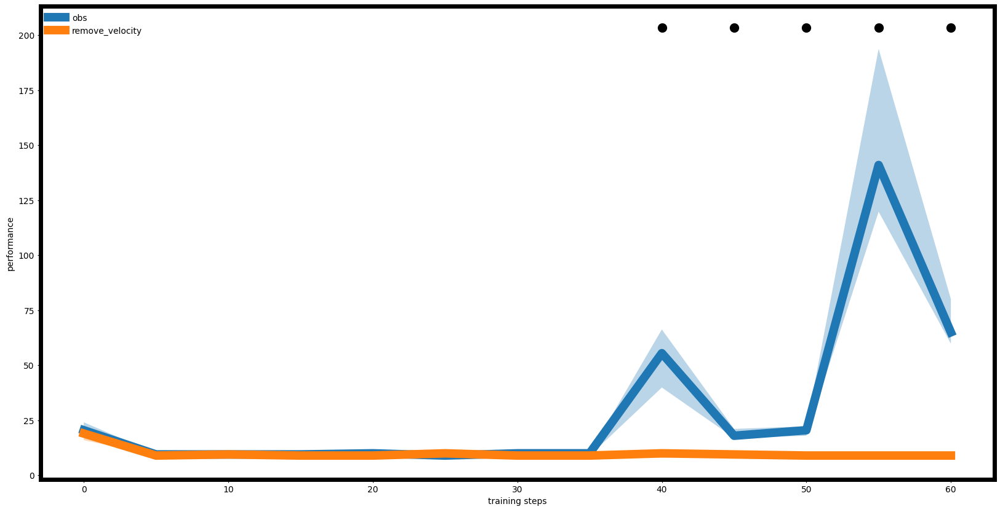

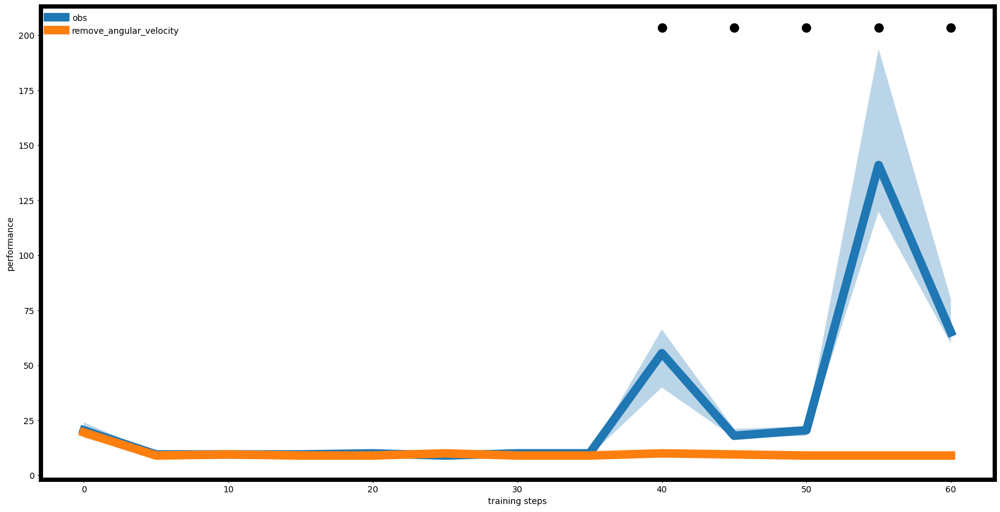

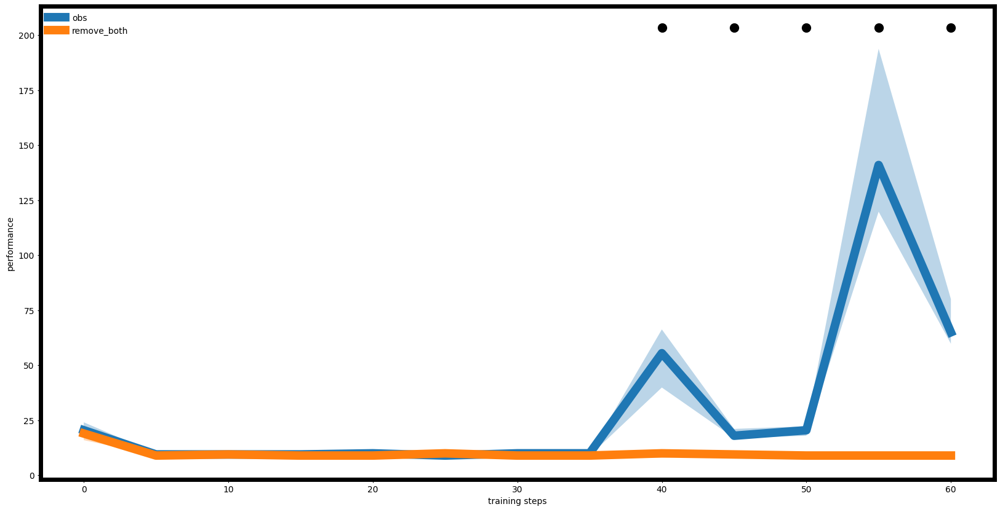

In [24]:
WelchTTest().plot(
    torch.stack(ddpg_obs.eval_rewards),
    torch.stack(ddpg_obs_remove_velocity.eval_rewards),
    legends="obs/remove_velocity",
    save=False,
)

WelchTTest().plot(
    torch.stack(ddpg_obs.eval_rewards),
    torch.stack(ddpg_obs_remove_angular_velocity.eval_rewards),
    legends="obs/remove_angular_velocity",
    save=False,
)

WelchTTest().plot(
    torch.stack(ddpg_obs.eval_rewards),
    torch.stack(ddpg_obs_remove_both.eval_rewards),
    legends="obs/remove_both",
    save=False,
)

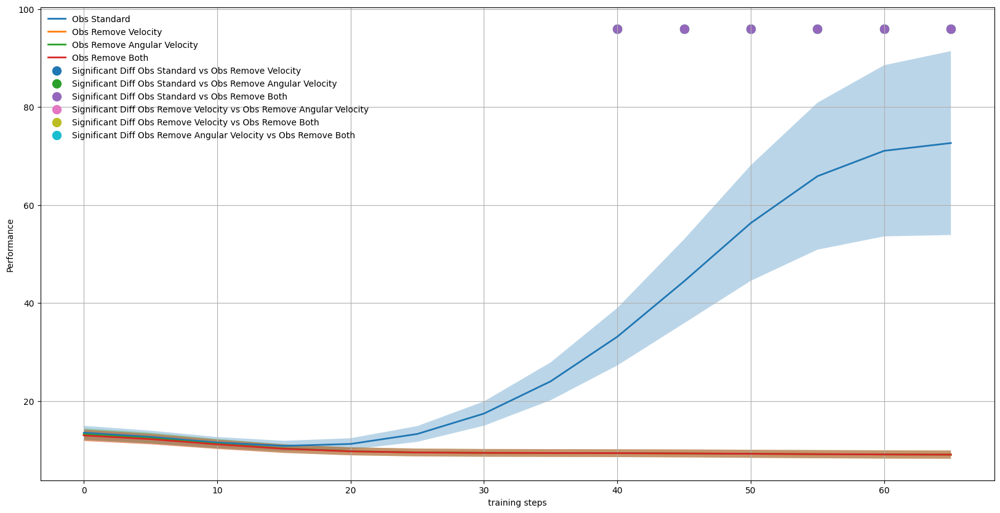

In [25]:
# Collect eval_rewards for each configuration
eval_rewards_histories = [
    torch.stack(ddpg_obs.eval_rewards).numpy(),
    torch.stack(ddpg_obs_remove_velocity.eval_rewards).numpy(),
    torch.stack(ddpg_obs_remove_angular_velocity.eval_rewards).numpy(),
    torch.stack(ddpg_obs_remove_both.eval_rewards).numpy(),
]

# Plot all four curves in a single figure
plot_multiple_curves(
    eval_rewards_histories,
    legends=["Obs Standard", "Obs Remove Velocity", "Obs Remove Angular Velocity", "Obs Remove Both"],
    point_every=5,
    id_central="mean",
    id_error="std",
    save=True
)

In [26]:
# 6: corresponding learning curves for acition time extension wrapper
ddpg_act = DDPG(conf, [lambda env: ActionTimeExtensionWrapper(env, M=2)])
run_ddpg(ddpg_act)

ddpg_act_remove_velocity = DDPG(conf, [lambda env: ActionTimeExtensionWrapper(FeatureFilterWrapper(env, 1), M=2)])
run_ddpg(ddpg_act_remove_velocity)

ddpg_act_remove_angular_velocity = DDPG(conf, [lambda env: ActionTimeExtensionWrapper(FeatureFilterWrapper(env, 3), M=2)])
run_ddpg(ddpg_act_remove_angular_velocity)

ddpg_act_remove_both = DDPG(conf, [lambda env: ActionTimeExtensionWrapper(FeatureFilterWrapper(FeatureFilterWrapper(env, 3), 1), M=2)])
run_ddpg(ddpg_act_remove_both)

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

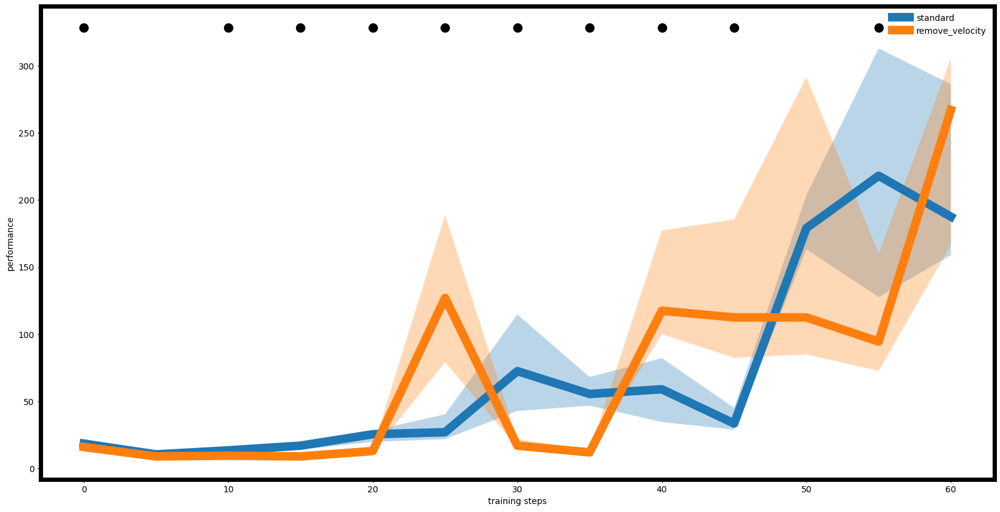

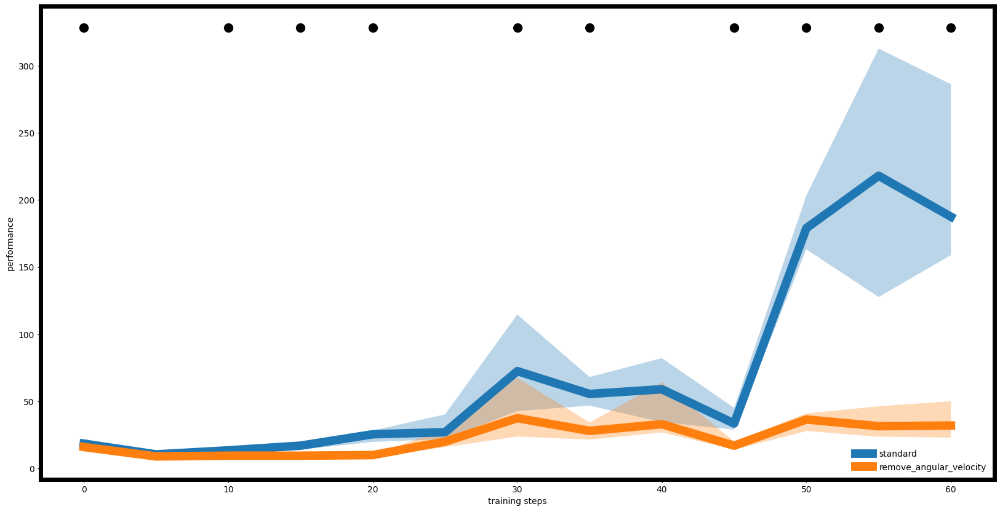

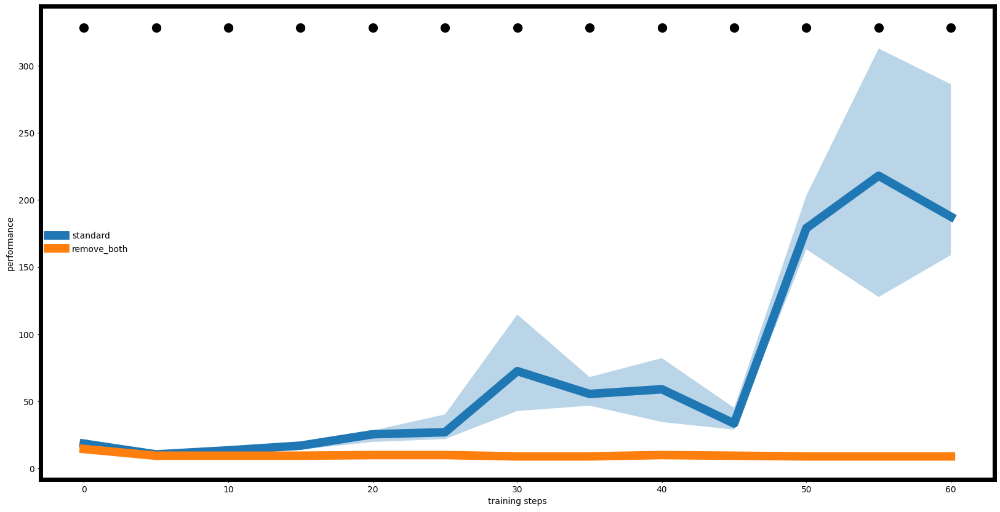

In [27]:
WelchTTest().plot(
    torch.stack(ddpg_act.eval_rewards),
    torch.stack(ddpg_act_remove_velocity.eval_rewards),
    legends="standard/remove_velocity",
    save=False,
)

WelchTTest().plot(
    torch.stack(ddpg_act.eval_rewards),
    torch.stack(ddpg_act_remove_angular_velocity.eval_rewards),
    legends="standard/remove_angular_velocity",
    save=False,
)

WelchTTest().plot(
    torch.stack(ddpg_act.eval_rewards),
    torch.stack(ddpg_act_remove_both.eval_rewards),
    legends="standard/remove_both",
    save=False,
)

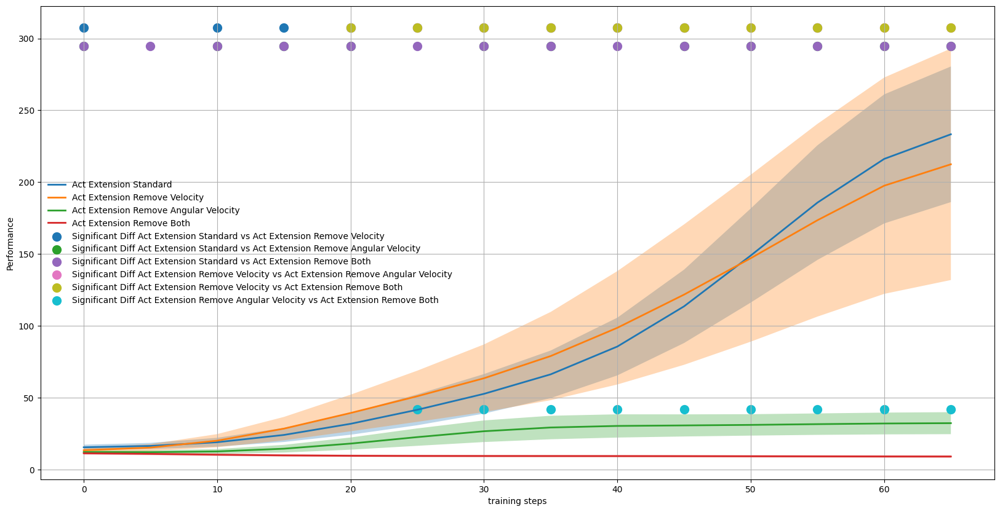

In [28]:
eval_rewards_histories = [
    torch.stack(ddpg_act.eval_rewards).numpy(),
    torch.stack(ddpg_act_remove_velocity.eval_rewards).numpy(),
    torch.stack(ddpg_act_remove_angular_velocity.eval_rewards).numpy(),
    torch.stack(ddpg_act_remove_both.eval_rewards).numpy(),
]

# Plot all four curves in a single figure
plot_multiple_curves(
    eval_rewards_histories,
    legends=["Act Extension Standard", "Act Extension Remove Velocity", "Act Extension Remove Angular Velocity", "Act Extension Remove Both"],
    point_every=5,
    id_central="mean",
    id_error="std",
    save=True
)

# Bonus

In [29]:
# Action sequence beyond 2
ddpg_act_3 = DDPG(conf, [lambda env: ActionTimeExtensionWrapper(env, M=3)])
run_ddpg(ddpg_act_3)

ddpg_act_3_remove_velocity = DDPG(conf, [lambda env: ActionTimeExtensionWrapper(FeatureFilterWrapper(env, 1), M=3)])
run_ddpg(ddpg_act_3_remove_velocity)


ddpg_act_3_remove_angular_velocity = DDPG(conf, [lambda env: ActionTimeExtensionWrapper(FeatureFilterWrapper(env, 3), M=3)])
run_ddpg(ddpg_act_3_remove_angular_velocity)

ddpg_act_3_remove_both = DDPG(conf, [lambda env: ActionTimeExtensionWrapper(FeatureFilterWrapper(FeatureFilterWrapper(env, 3), 1), M=3)])
run_ddpg(ddpg_act_3_remove_both)

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

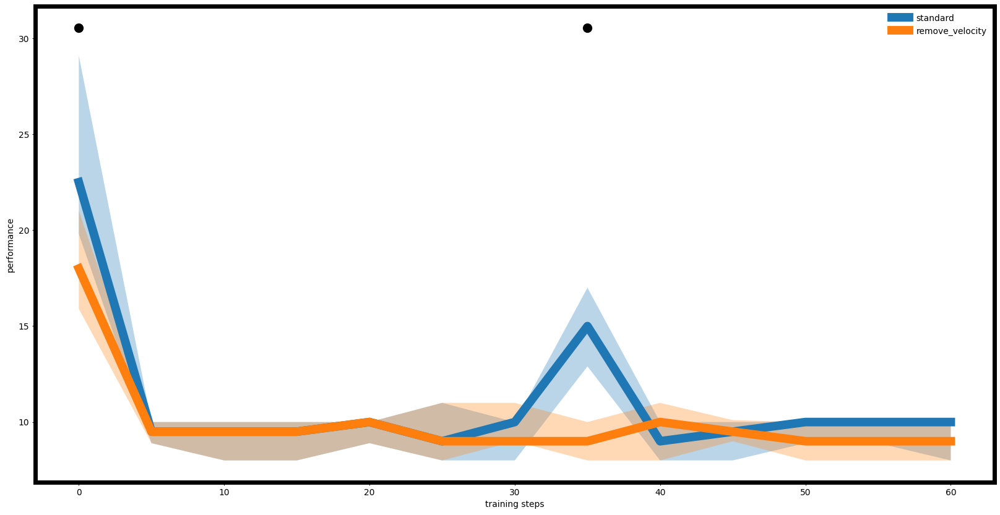

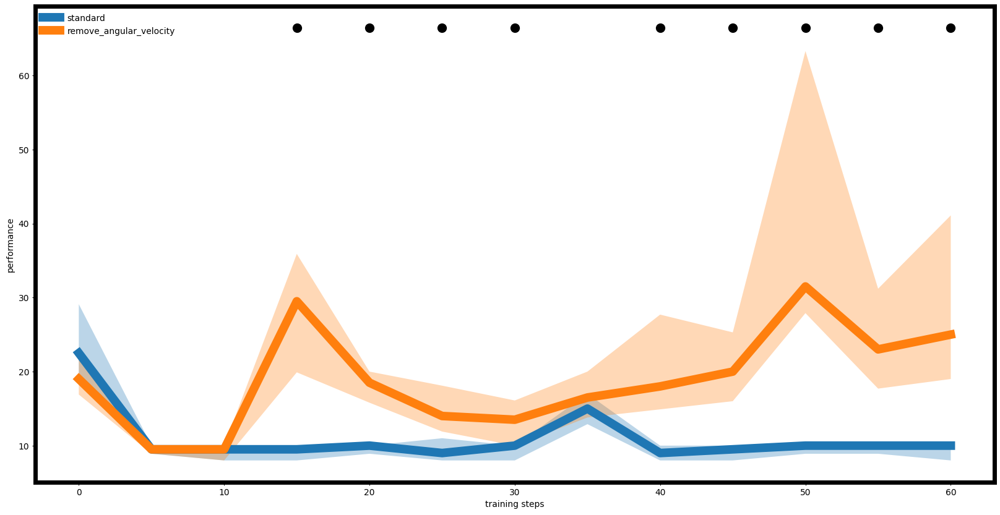

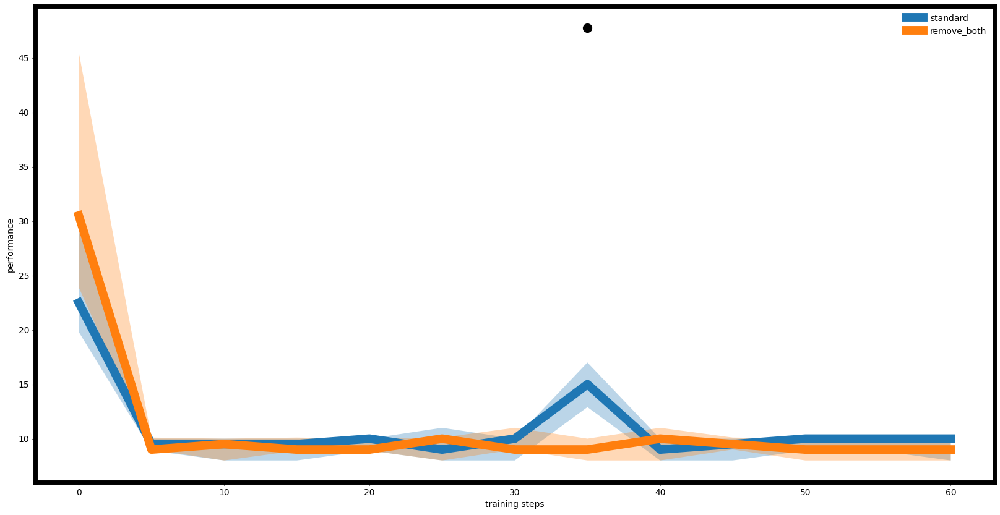

In [31]:
WelchTTest().plot(
    torch.stack(ddpg_act_3.eval_rewards),
    torch.stack(ddpg_act_3_remove_velocity.eval_rewards),
    legends="standard/remove_velocity",
    save=False,
)

WelchTTest().plot(
    torch.stack(ddpg_act_3.eval_rewards),
    torch.stack(ddpg_act_3_remove_angular_velocity.eval_rewards),
    legends="standard/remove_angular_velocity",
    save=False,
)

WelchTTest().plot(
    torch.stack(ddpg_act_3.eval_rewards),
    torch.stack(ddpg_act_3_remove_both.eval_rewards),
    legends="standard/remove_both",
    save=False,
)

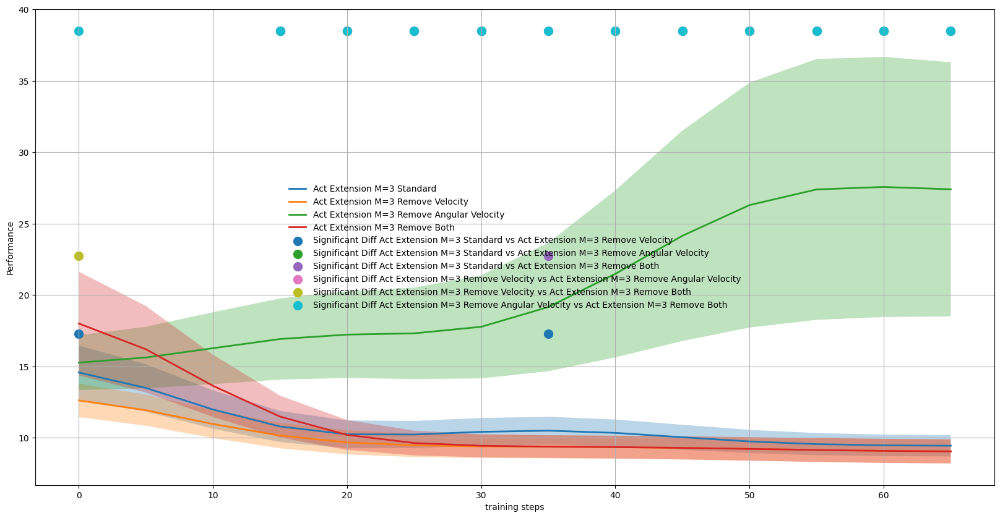

In [32]:
eval_rewards_histories = [
    torch.stack(ddpg_act_3.eval_rewards).numpy(),
    torch.stack(ddpg_act_3_remove_velocity.eval_rewards).numpy(),
    torch.stack(ddpg_act_3_remove_angular_velocity.eval_rewards).numpy(),
    torch.stack(ddpg_act_3_remove_both.eval_rewards).numpy(),
]

# Plot all four curves in a single figure
plot_multiple_curves(
    eval_rewards_histories,
    legends=["Act Extension M=3 Standard", "Act Extension M=3 Remove Velocity", "Act Extension M=3 Remove Angular Velocity", "Act Extension M=3 Remove Both"],
    point_every=5,
    id_central="mean",
    id_error="std",
    save=True
)

# Lab report

Your report should contain:
- your source code (probably this notebook), do not forget to put your names on top of the notebook,
- in a separate pdf file with your names in the name of the file:
    + a detailed enough description of all the choices you have made: the parameters you have set, the algorithms you have used, etc.,
    + the curves obtained when doing Exercise 3,
    + your conclusion from these experiments.

Beyond the elements required in this report, any additional studies will be rewarded.
For instance, you can extend the temporal horizon for the state memory and or action sequences beyond 2, and study the
impact on learning performance and training time,
you can play with other partially observable environments, etc.
A great achievement would be to perform a comparison with the approach based on an LSTM.